# Reti Neurali e Deep Learning
## Laboratorio: Introduzione a Keras


### Introduzione


In questa sessione costruiremo una rete neurale con Keras ed eseguiremo l'algoritmo di retropropagazione dell'errore (o suoi derivati), come implementato dalla libreria, sul dataset Fashion-MNIST.

In [1]:
from base64 import decodebytes
print(decodebytes(b'RCdhY2NvcmRvLCBjb21pbmNpYW1vIQ==\n').decode('utf-8'))

D&#39;accordo, cominciamo!


Installazione e importazione delle librerie software necessarie

In [2]:
import matplotlib
import matplotlib.pyplot as plt
import numpy as np
import random

from pprint import pprint
from sklearn.decomposition import PCA
from tensorflow import keras

matplotlib.rcParams['figure.figsize'] = [12,12]

### Dati

Caricamento del dataset usato per l'allenamento della rete neurale

4423680/4422102 [==============================] - 0s 0us/step
Caricato e normalizzato il dataset Fashion-MNIST.
Il training set e il test set sono composti rispettivamente da 60000 e 10000 esempi.
Ogni esempio è un&#39;immagine 28x28 (784 dimensioni totali)
Sono possibili 10 output: [&#39;T-shirt/top&#39;, &#39;Trouser&#39;, &#39;Pullover&#39;, &#39;Dress&#39;, &#39;Coat&#39;, &#39;Sandal&#39;, &#39;Shirt&#39;, &#39;Sneaker&#39;, &#39;Bag&#39;, &#39;Ankle boot&#39;]

Ecco alcuni esempi:


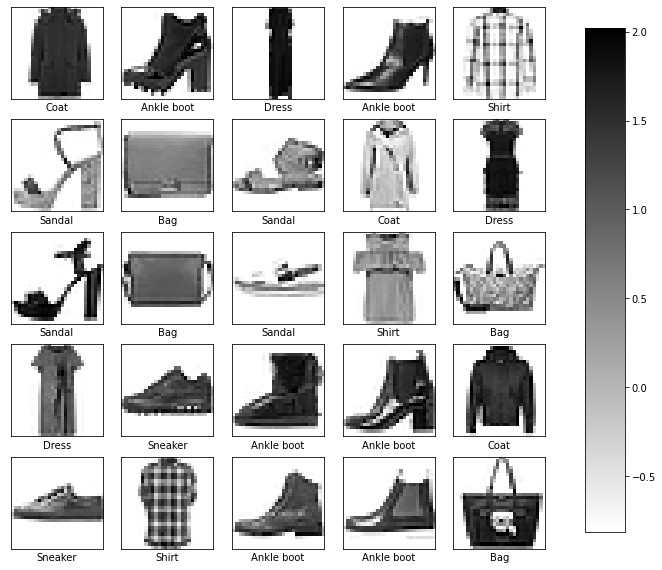

In [3]:
# Caricamento
fashion_mnist = keras.datasets.fashion_mnist
(X_train, y_train), (X_test, y_test) = fashion_mnist.load_data()
y_names = ['T-shirt/top', 'Trouser', 'Pullover', 'Dress', 'Coat', 'Sandal', 'Shirt', 'Sneaker', 'Bag', 'Ankle boot']

# Normalizzazione
X = np.concatenate([X_train, X_test])
mean = np.average(X)
std = np.std(X)
X_train = (X_train - mean) / std
X_test = (X_test - mean) / std

# Analisi
print(f'Caricato e normalizzato il dataset Fashion-MNIST.')
print(f'Il training set e il test set sono composti rispettivamente da {X_train.shape[0]} e {X_test.shape[0]} esempi.')
print(f'Ogni esempio è un\'immagine {X_train.shape[1]}x{X_train.shape[2]} ({X_train[0].size} dimensioni totali)')
print(f'Sono possibili {len(y_names)} output: {str(y_names)}')

print('\nEcco alcuni esempi:')

fig = plt.figure(figsize=(11,10))
for i, (img, label) in enumerate(random.choices(list(zip(X_train, y_train)), k=25)):
    plt.subplot(5,5,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(img, cmap=plt.cm.binary)
    plt.xlabel(y_names[label])
fig.subplots_adjust(right=0.8)
cbar_ax = fig.add_axes([0.85, 0.15, 0.05, 0.7])
plt.colorbar(cax=cbar_ax)
plt.show()

Visualizzazione dei dati su un piano cartesiano bidimensionale usando l'analisi delle componenti principali (PCA).

La PCA ha conservato il 46.80% dell&#39;informazione contenuta nei dati.


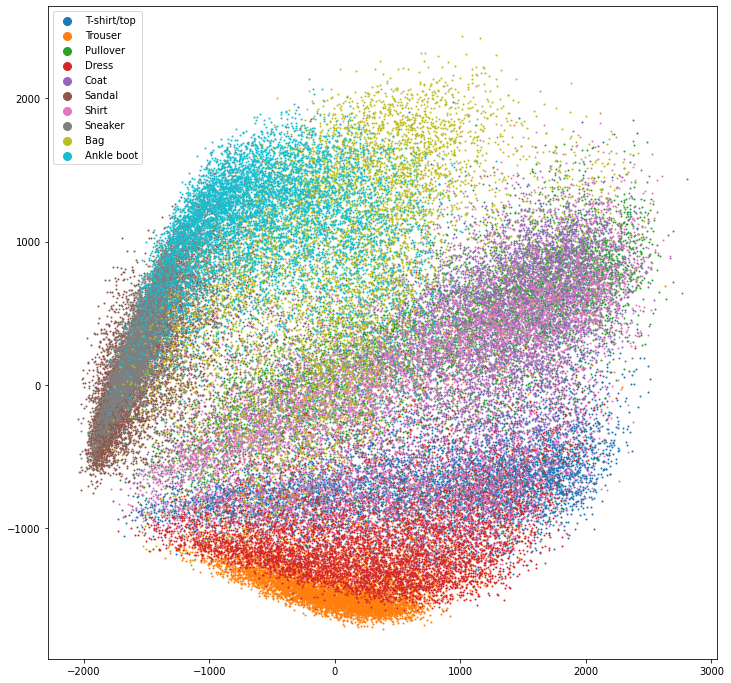

In [4]:
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X.reshape(X.shape[0], -1))
print(f'La PCA ha conservato il {100 * sum(pca.explained_variance_ratio_):.2f}% dell\'informazione contenuta nei dati.')

y = np.concatenate([y_train, y_test])
for i, l in enumerate(y_names):
  j = np.where(y == i)
  X_plot = X_pca[j]
  plt.scatter(X_plot[:,0], X_plot[:,1], label=l, c=f'C{i}', s=1)
plt.legend(markerscale=8)
plt.show()

### Architettura

Keras contiene, tra le altre cose, classi e funzioni che implementano:
*   Operazioni delle reti neurali (somme pesate, attivazioni...)
*   Calcolo delle derivate automatico
*   Algoritmo di retropropagazione dell'errore e suoi derivati (SGD, momentum, Adam...)

Non è quindi necessario programmarli a manina, ma basterà definire la sequenza dei calcoli della nostra rete.

Per il momento ci limitiamo ad importare quello che ci serve:



In [5]:
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Flatten, Dense

### Errore

Per problemi di classificazione possiamo usare come funzione di loss (misura dell'errore) l'[entropia incrociata](https://towardsdatascience.com/understanding-binary-cross-entropy-log-loss-a-visual-explanation-a3ac6025181a), che tende a dare risultati migliori di MSE:

![cross entropy formula](https://miro.medium.com/max/320/1*loucyTXzGHuHi6D4PxjDlA.png)

### Apprendimento

Come già detto, gli algoritmi di apprendimento sono implementati da Keras, così come la procedura di early stopping:

In [6]:
from tensorflow.keras.optimizers import SGD, Adam
from tensorflow.keras.callbacks import EarlyStopping

...un momento, cosa significa [early stopping](https://towardsdatascience.com/early-stopping-a-cool-strategy-to-regularize-neural-networks-bfdeca6d722e)?

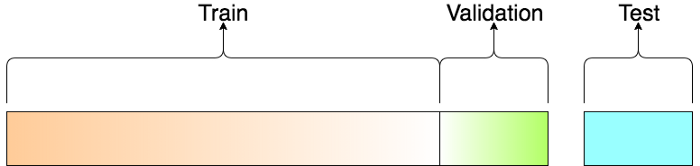

Definiamo alcuni **iperparametri**:
* h: numero di neuroni dello strato nascosto (o degli strati nascosti)
* eta: tasso di apprendimento o *learning rate*
* alpha: coefficiente per il momentum
* batch_size: numero di esempi su cui calcolare i gradienti
* epochs: numero massimo di epoche per apprendimento. Un'epoca è un singolo utilizzo da parte della rete di ogni elemento del dataset per l'apprendimento
* patience: numero di epoche senza miglioramento delle prestazioni dopo le quali l'allenamento è fermato


In [7]:
h = 512

eta = 0.01
alpha = 0.9
batch_size = 64

epochs = 500  # Numero alto, per rendere più probabile l'early stopping
patience = 7

Il codice per l'allenamento vero e proprio è questo:

In [10]:
# Creazione della rete #lista di strati
model = Sequential([
    Reshape(input_shape=(28,28), target_shape=(28,28,1)),
    Conv2D(32, 3, strides=1, padding='valid', activation='relu'),
    MaxPool2D(pool_size=2, strides=2, padding='valid'),
    Conv2D(64, 3, strides=1, padding='valid', activation='relu'),
    MaxPool2D(pool_size=2, strides=2, padding='valid'),
    Flatten(input_shape=X_train[0].shape),
    Dense(h, activation='relu'),
    Dense(len(y_names), activation='softmax')
])
model.summary()

# Parametri per l'apprendimento
model.compile(optimizer=SGD(learning_rate=eta, momentum=alpha),
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

# Apprendimento (il criterio di terminazione sarà early stopping o il numero di epoche)
history = model.fit(X_train, y_train, verbose=1,
                    epochs=epochs,
                    batch_size=batch_size,
                    callbacks=[EarlyStopping(monitor='val_accuracy', patience=patience, restore_best_weights=True)],
                    validation_split=0.1)

print('\nDone!')

train_loss, train_accuracy = model.evaluate(X_train, y_train, verbose=0)
print(f'\nTraining error is {train_loss:.4f}')
print(f'Training accuracy is {100*train_accuracy:.2f}%')

# best_epoch = np.argmin(history.history['val_loss'])
best_epoch = np.argmax(history.history['val_accuracy'])
print(f'\nValidation error is {history.history["val_loss"][best_epoch]:.4f}')
print(f'Validation accuracy is {100*history.history["val_accuracy"][best_epoch]:.2f}%')


Model: &quot;sequential&quot;
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
reshape (Reshape)            (None, 28, 28, 1)         0         
_________________________________________________________________
conv2d (Conv2D)              (None, 26, 26, 32)        320       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 13, 13, 32)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 11, 11, 64)        18496     
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 5, 5, 64)          0         
_________________________________________________________________
flatten (Flatten)            (None, 1600)              0         
_________________________________________________________________
dense (Dense)                (None, 512)      

### Valutazione


Visualizziamo come è evoluto l'errore durante l'apprendimento:

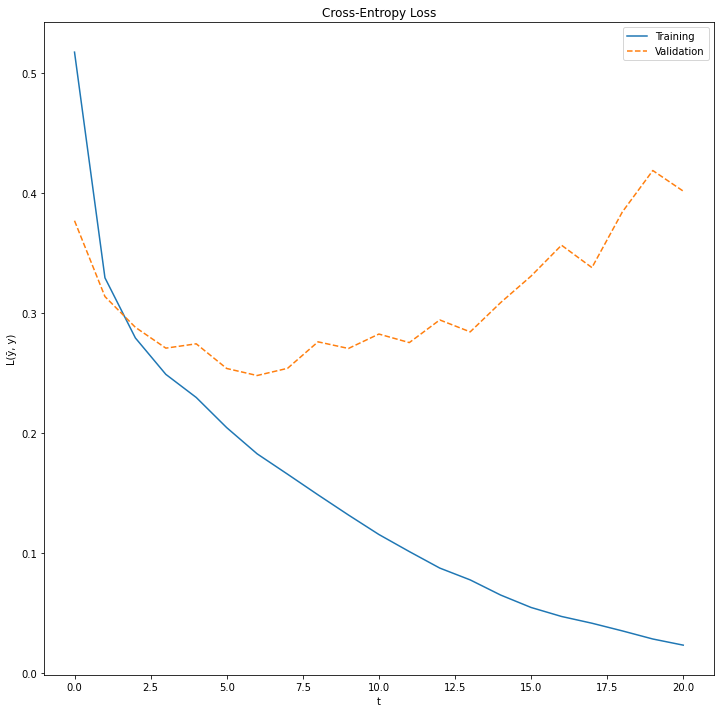

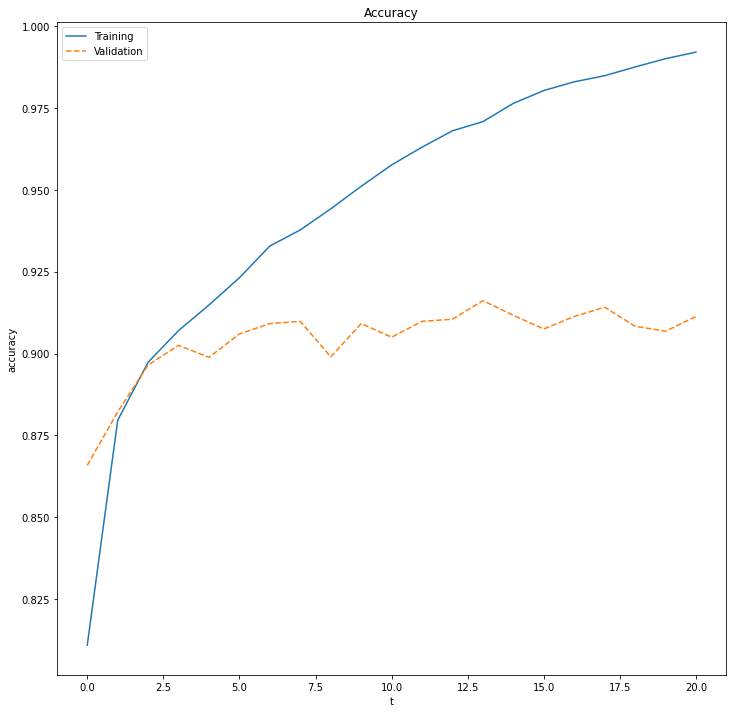

In [11]:
# Grafico dell'entropia (funzione di errore)
plt.title('Cross-Entropy Loss')
plt.plot(history.history['loss'], label='Training')
plt.plot(history.history['val_loss'], label='Validation', ls='--')
plt.xlabel('t')
plt.ylabel('L(ỹ, y)')
plt.legend()
plt.show()

# Grafico dell'accuratezza
plt.title('Accuracy')
plt.plot(history.history['accuracy'], label='Training')
plt.plot(history.history['val_accuracy'], label='Validation', ls='--')
plt.xlabel('t')
plt.ylabel('accuracy')
plt.legend()
plt.show()

Come si comporta la rete su dati mai visti?

In [12]:
_, test_accuracy = model.evaluate(X_test, y_test, verbose=0)
print(f'Test accuracy is {100*test_accuracy:.2f}%')

Test accuracy is 90.85%


Visualizziamo alcune immagini mal classificate:

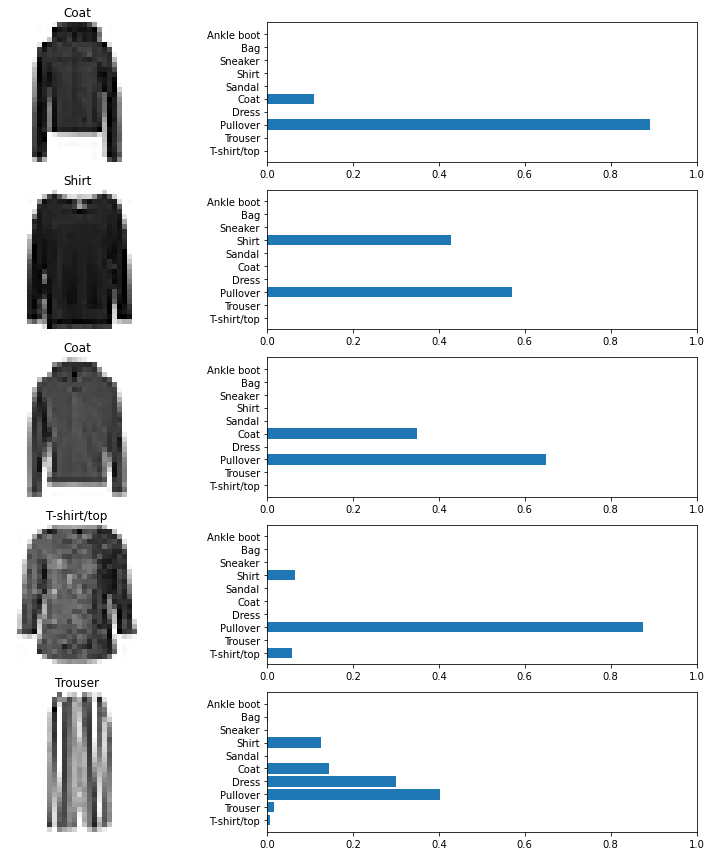

In [13]:
y_ = model.predict(X_test)
i = np.where(y_test != y_.argmax(-1))
X_wrong, y_ok, y_ko = X_test[i], y_test[i], y_[i]

examples = random.choices(list(zip(X_wrong, y_ok, y_ko)), k=5)
for i, (img, ok, ko) in enumerate(examples):
    plt.subplot(5, 2, 2*i+1)
    plt.axis('off')
    plt.imshow(img.reshape(28,28), cmap=plt.cm.binary, interpolation='none')
    plt.title(y_names[ok])
    plt.subplot(5, 2, 2*i+2)
    plt.barh(y_names, ko)
    plt.xlim([0, 1])

plt.tight_layout()
plt.show()

Proviamo a visualizzare globalmente l'insieme di test:

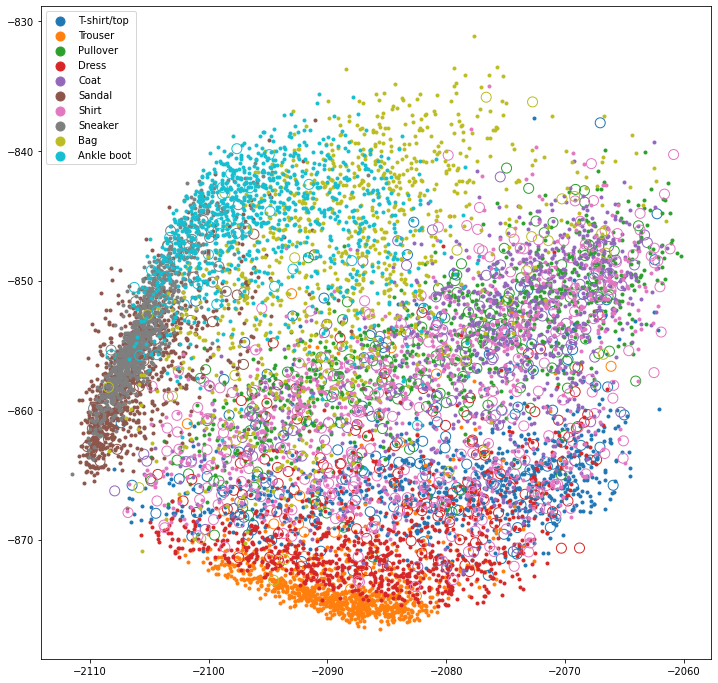

In [14]:
y_ = y_.argmax(-1)
X_test_pca = pca.transform(X_test.reshape(X_test.shape[0], -1))

X_ok, y_ok = X_test_pca[y_test == y_], y_test[y_test == y_]
X_ko, y_ko = X_test_pca[y_test != y_], y_test[y_test != y_]

for i, l in enumerate(y_names):
  j = np.where(y_ok == i)
  plt.scatter(X_ok[j][:,0], X_ok[j][:,1], marker='.', label=l, c=f'C{i}')
  j = np.where(y_ko == i)
  plt.scatter(X_ko[j][:,0], X_ko[j][:,1], facecolors='none', edgecolors=f'C{i}', s=100)
plt.legend(markerscale=3)
plt.show()

I risultati sono soddisfacenti? Prova a variare:
* il numero strati nascosti e le loro dimensioni
* il numero massimo di epoche
* il numero di epoche in cui "pazientare"
* la dimensione dei mini-batch
* l'algoritmo di apprendimento (per provare Adam, sostituire `SGD(...)` con `Adam(learning_rate=eta)`)
* il valore del tasso di apprendimento, eta (solitamente si usano potenze negative di 10)
* il coefficiente del momentum, alfa (solo per SGD, deve essere compreso tra 0 e 1)

**In ogni caso, essendo il modello attuale un percettrone multilivello, l'accuracy non arriverà al 90%.**

### Bonus

Una rete neurale classica come un MLP non si adatta bene al riconoscimento di immagini.

Oltre all'ottimizzazione degli iperparametri, possiamo inserire nella struttura della rete (Sez. *Apprendimento*) blocchi diversi da quelli completamente connessi.

Quali di questi blocchi ti sono familiari? Importa e usa quelli che possono aiutarti ad arrivare a superare il 91% di accuracy.
 * [Global Average Pooling](https://www.tensorflow.org/api_docs/python/tf/keras/layers) - [Lin et al. 2014](https://arxiv.org/pdf/1312.4400.pdf): `Average()`
 * [Reshape](https://www.tensorflow.org/api_docs/python/tf/keras/layers/Reshape): `Reshape(input_shape=(28, 28), target_shape=(28, 28, 1))`
 * [Batch Normalization](https://www.tensorflow.org/api_docs/python/tf/keras/layers/BatchNormalization) - [Ioffe et al. 2015](http://proceedings.mlr.press/v37/ioffe15.pdf): `BatchNormalization()`
 * [Average-pooling](https://www.tensorflow.org/api_docs/python/tf/keras/layers/AveragePooling2D): `AveragePooling2D(pool_size=2, strides=2, padding='valid')`
 * [Convoluzione](https://www.tensorflow.org/api_docs/python/tf/keras/layers/Conv2D): `Conv2D(filters, kernel_size, strides=1, padding='valid', activation='relu')`
 * [Dropout](https://www.tensorflow.org/api_docs/python/tf/keras/layers/Dropout) - [Srivastava et al. 2014](https://jmlr.org/papers/volume15/srivastava14a/srivastava14a.pdf): `Dropout(rate)`
 * [Layer Normalization](https://www.tensorflow.org/api_docs/python/tf/keras/layers/LayerNormalization) - [Ba et al. 2016](https://arxiv.org/pdf/1607.06450.pdf): `LayerNormalization()`
 * [Max-pooling](https://www.tensorflow.org/api_docs/python/tf/keras/layers/MaxPool2D): `MaxPool2D(pool_size=2, strides=2, padding='valid')`

In [9]:
from tensorflow.keras.layers import Reshape, Conv2D, MaxPool2D